# End-to-end Multi-class Dog Breed Classification

This notebook builds an end to end multi class image
classifier using TensorFlow 2.0 and TensorFlow HUb.


## 1. Problem

Identifying the breed of a dog given a image of the dog.

## 2. Data

The data used is from kaggele competition

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some info about the data:
* Dealing with images(unstructured data) so it's
probably best we use deep learning/ transfer learning.

* there are 120 breeds of dogs (this means there are 120 different classes).

* there are 10k+ images in training set
(these images have labels)

* there are 10k+ images in the test (these images have no labels, because we want to predict them)


In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
from google import colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version : ",tf.__version__)
print("TF hub version: ",hub.__version__)

# Check for GPU availability
print("GPU","available(Nimce!!!!)" if tf.config.list_physical_devices("GPU") else "not available: ()")

TF version :  2.12.0
TF hub version:  0.14.0
GPU available(Nimce!!!!)


## Getting our data ready (turning into Tensors)

With all ML models, our data has to be in numerical format. So that's the first task ,turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
#Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())




                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

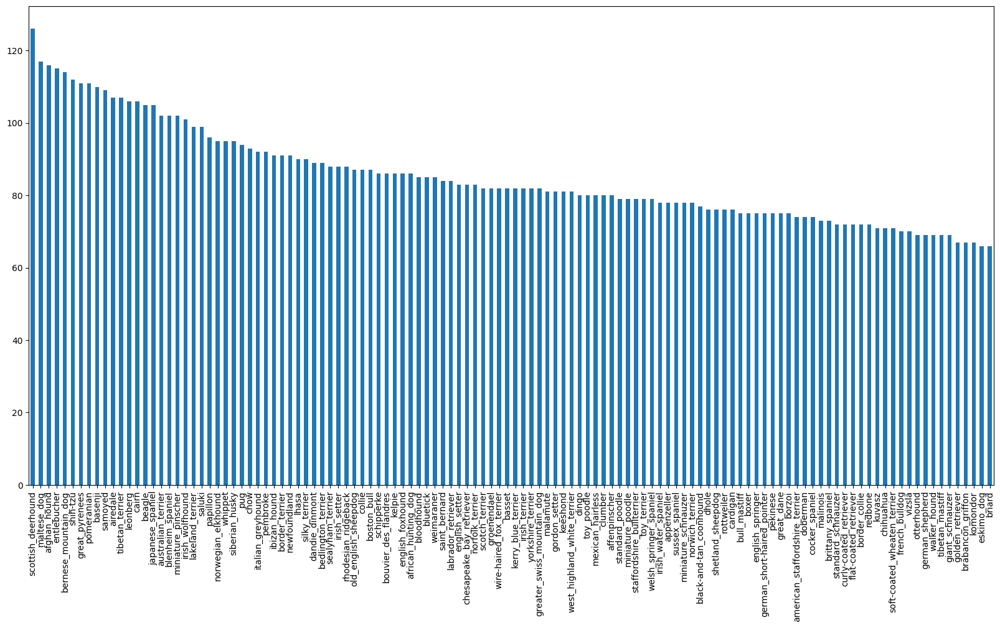

In [ ]:
# How many images are there of each breed?

labels_csv["breed"].value_counts().plot.bar(figsize= (20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

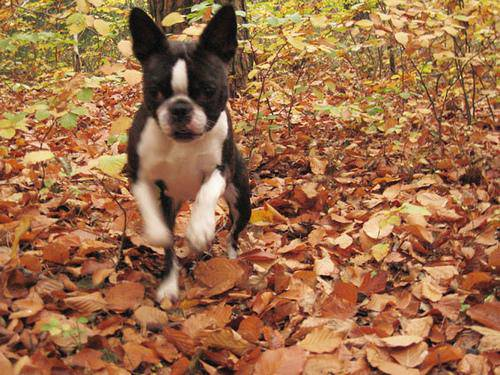

In [ ]:
# Let's view an image

from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting Images and their Labels

Let's get a list of all our Image file pathnames

In [ ]:
# Create pathnames from image ID's

filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname +".jpg" for fname in labels_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
len(os.listdir("/content/drive/MyDrive/Dog Vision/train"))


10222

In [ ]:
len(filenames)

10222

In [ ]:
#Check whether number of filename matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target direcrtory.")

Filenames match actual amount of files!


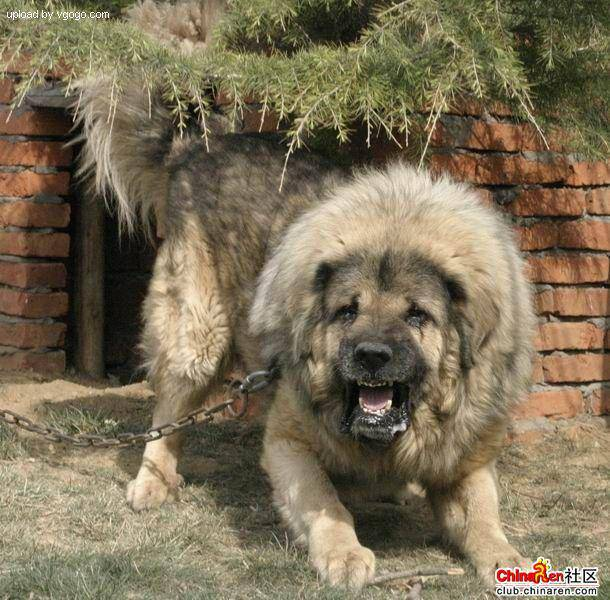

In [ ]:
#one more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

After getting training image filepaths in a list , now should prepare labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of label matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches the number of filenames!


In [ ]:
# Find the Unique labels
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn the single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example turing boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds== labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since Kaggle dataset doesn't come with a validation set, so there is a need to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y= boolean_labels

In [ ]:
len(y)

10222

We're going to start off experimentation with 1k images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES  = 1000 #@param{type:"slider", min: 1000, max:10000, step :1000}


In [ ]:
# Split our data into validation and train
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val= train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],
                                                 test_size=0.2, random_state=42)
len(X_train,), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
#Lets have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

# Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a
variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the image to a shape of (224, 224)
6. Return the modified image

**Note** : Check "TensorFlow Data Loading" for more

Before we do, lets see what importing an image looks like.

In [ ]:
#Convert an image into a  Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape


(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
#converting into tensors
tf.constant(image)[:2] # has the advantage of gpu over numpy making it faster for computation

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE=224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Take an image path and turns the image into a Tensor.
  """
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels(Red, Green, Blue)
  image= tf.image.decode_jpeg(image,channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image,tf.float32)

  #Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
# yann lecun batch size/ jeremy howard batch size @ twitter


## Turning our data into batches

Why to turn data into batches?
> IF you're trying to fit say 10k+ images in one go, then it's a possibility that they all might not fit into memory.

So, that's why, should opt for 32(batch size) images at a time (which is manually adjustable).

For effective use of TensorFlow, we need our data in the form of Tensor tuples:
'(images, label)'

In [ ]:
# Create a simple function to return a tuple(image,label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image
  and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image,label

In [ ]:
(process_image(filenames[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label).
Let's make a function to make all of our data (x & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE= 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but does'nt shuffle if it's validation
  data.
  Also accepts test data as input(no labels).
  """

  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch= data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y)))  #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Create training data batches....")
    #Turn filepaths and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Create(image,label) tuple(this also turns the image path into a preprocessed image)
    data= data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch



In [ ]:
#Create training and validation data batches
train_data =  create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val, y_val, valid_data= True)

Create training data batches....
Creating validation data batches....


In [ ]:
#Checkout the diff attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however , these can be a little hard to understand/comprehend.

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images (images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 cols)
    ax= plt.subplot(5, 5, i+1)
  # Display an image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

    #turn the gridlines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.19408797, 0.28036246, 0.19800954],
          [0.23879156, 0.3329092 , 0.24663469],
          [0.27041498, 0.36516288, 0.2707301 ],
          ...,
          [0.21207984, 0.23168768, 0.35717785],
          [0.21335846, 0.21970792, 0.33535513],
          [0.16004002, 0.16396159, 0.2737655 ]],
 
         [[0.22781232, 0.31122443, 0.23459628],
          [0.30094218, 0.38933507, 0.30592293],
          [0.27730998, 0.37205788, 0.28288987],
          ...,
          [0.21207984, 0.23168768, 0.35717785],
          [0.21106748, 0.22627144, 0.33983615],
          [0.16145413, 0.17396289, 0.28662923]],
 
         [[0.23364425, 0.31429902, 0.2397892 ],
          [0.29211608, 0.3775415 , 0.29688674],
          [0.24122696, 0.3353446 , 0.24857631],
          ...,
          [0.21515232, 0.23560925, 0.36109942],
          [0.2153861 , 0.22931536, 0.3491021 ],
          [0.17227751, 0.1888129 , 0.30338746]],
 
         ...,
 
         [[0.8243171 , 0.27438706, 0.30477706],
          [0.84337

In [ ]:
len(train_images) , len(train_labels)

(32, 32)

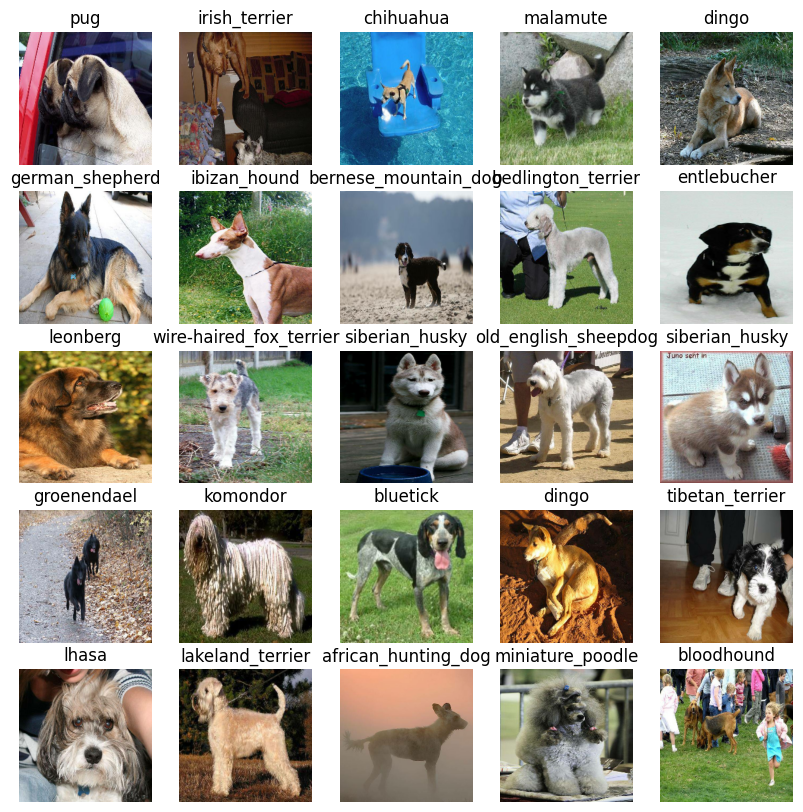

In [ ]:
# Let's visualize the data in a training batch
show_25_images(train_images, train_labels)

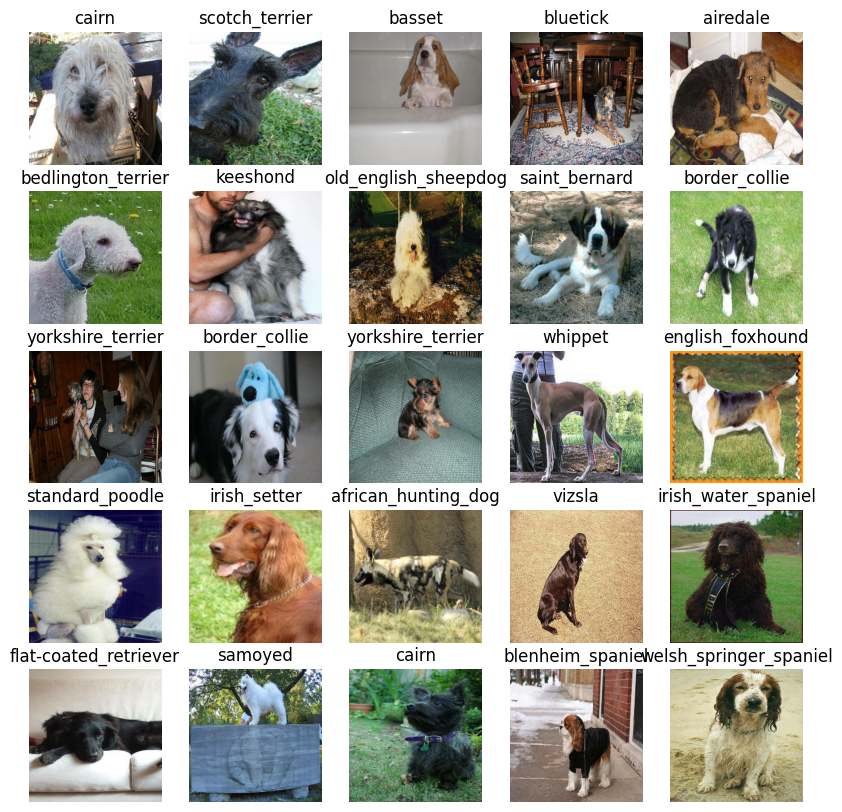

In [ ]:
# Now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

1. The input shape (our image shape, in the form of Tensors ) to our model.

2. The output shape(image labels, in the form of Tensors ) of our model.

3. The URL of the model we want to use is from TensorFlow Hub- https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height , width, color channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from TensorFlow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs , outputs and model ready to go .
Let's put them together into Keras deep learning model!

Knowing this, lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.

* Defines the layer in a Keras model in sequential fashion(do this first, then this, then that)

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tell the model the input shape it'll be getting).

* Returns the model.

All these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
#Create a function which builds a keras model
def create_model(input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
      activation="softmax") #layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model= create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating  callbacks

Callbacks are helper functions a model use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir= os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                       #Make it , so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



## Early stopping callback

* Prevents model from overlearning over the provided dataset , which could otherwise lead to the problem of not generalizing the test(other) dataset.

* Early stopping helps us to stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping (monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.


In [ ]:
NUM_EPOCHS = 100 # @param {type: "slider", min:10, max:100, step: 10}


In [ ]:
# Check to make sure the prescence of GPU
print("GPU", "available (Nimce!!!)" if tf.config.list_physical_devices("GPU") else "Not available")



GPU available (Nimce!!!)


Let's create a function which trains a model.

* Create a model using 'create_model()'
* Setup a TensorBoard callback using ' create _tensorboard_callback()'
* Call the fit() function on our model passing our training and validation data, number of epochs to train for ('NUM_EPOCHS') and callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model= create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x= train_data,
            epochs= NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model



In [ ]:
# Fit the model to the data
model= train_model() # first epoch takes comparatively more time than others as initialization/loading of data in the memomry takes place in the first phase

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 133s 4s/step - loss: 4.6417 - accuracy: 0.0950 - val_loss: 3.4405 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.6932 - accuracy: 0.6837 - val_loss: 2.1348 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 4s 151ms/step - loss: 0.5917 - accuracy: 0.9200 - val_loss: 1.6946 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 3s 124ms/step - loss: 0.2644 - accuracy: 0.9800 - val_loss: 1.5061 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1505 - accuracy: 0.9987 - val_loss: 1.4040 - val_accuracy: 0.6950
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1021 - accuracy: 1.0000 - val_loss: 1.3586 - val_accuracy: 0.7000
Epoch 7/100
25/25 [==============================

An inference that could be drawn out from above running is that the trained model is overfiiting, and how ?
because our accuracy: 1.000 (which means 100% ) on our training data but on validation dataset accuracy falls to approx
0.67  (67%) which concludes that our model is yet not able to generalize the patterns provided in the dataset.

**NOTE** : Overfitting does not mean our model building is on wrong path, rather it means our model has started learning, but it still requires some more work!

## Checking the TensorBoard logs

The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and visualize its contents

In [ ]:
#for training dataset
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs --port 8000


<IPython.core.display.Javascript object>

## Making and evaluating using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1 )
predictions

7/7 [==============================] - 2s 99ms/step


array([[2.1882411e-03, 7.0639704e-05, 1.9291306e-03, ..., 2.5997494e-04,
        1.2292737e-05, 8.4604556e-03],
       [6.6789589e-04, 1.4376751e-03, 3.2122217e-03, ..., 7.5376430e-04,
        1.2761368e-03, 8.3143663e-05],
       [9.7998542e-05, 4.2734176e-04, 1.6960119e-04, ..., 2.6077576e-04,
        2.4027007e-05, 4.7029098e-03],
       ...,
       [9.1535703e-06, 1.5704114e-05, 2.4662371e-05, ..., 5.0597435e-05,
        8.1589475e-05, 3.0229738e-05],
       [2.4813612e-03, 2.3341259e-04, 1.8802115e-04, ..., 1.0863487e-04,
        2.6088759e-05, 1.1918470e-02],
       [1.0856694e-03, 2.4145750e-04, 1.6804253e-03, ..., 2.3339163e-03,
        1.2907136e-03, 1.1910932e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([2.18824111e-03, 7.06397041e-05, 1.92913064e-03, 1.54341353e-04,
       1.71553774e-03, 2.87900111e-05, 1.75637398e-02, 2.43986520e-04,
       4.93158528e-04, 3.42757266e-04, 1.10128254e-03, 1.43576588e-04,
       1.59253483e-04, 2.69382926e-05, 2.58556945e-04, 3.08981631e-04,
       8.65326510e-05, 2.46643856e-01, 1.46664461e-05, 1.14168273e-04,
       4.69333929e-04, 1.06594125e-04, 4.16771145e-05, 8.90903815e-04,
       2.10927501e-05, 1.75585132e-03, 2.79067129e-01, 1.10681292e-04,
       3.59981059e-04, 3.95014009e-04, 9.44456333e-05, 6.87682535e-04,
       1.28717060e-04, 3.44596592e-05, 4.47416314e-05, 3.04128826e-02,
       3.00309533e-04, 1.63172328e-04, 4.04440289e-05, 3.48045869e-04,
       5.99534251e-04, 6.09464496e-06, 1.12546120e-04, 2.32887163e-04,
       2.01246949e-05, 3.30774434e-04, 5.23911986e-05, 2.09001766e-04,
       7.20253272e-04, 9.38180892e-05, 4.60875483e-04, 6.53100578e-05,
       7.67404970e-04, 7.98550391e-05, 1.04384126e-04, 1.91225321e-04,
      

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index=0
print(predictions[0])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[2.18824111e-03 7.06397041e-05 1.92913064e-03 1.54341353e-04
 1.71553774e-03 2.87900111e-05 1.75637398e-02 2.43986520e-04
 4.93158528e-04 3.42757266e-04 1.10128254e-03 1.43576588e-04
 1.59253483e-04 2.69382926e-05 2.58556945e-04 3.08981631e-04
 8.65326510e-05 2.46643856e-01 1.46664461e-05 1.14168273e-04
 4.69333929e-04 1.06594125e-04 4.16771145e-05 8.90903815e-04
 2.10927501e-05 1.75585132e-03 2.79067129e-01 1.10681292e-04
 3.59981059e-04 3.95014009e-04 9.44456333e-05 6.87682535e-04
 1.28717060e-04 3.44596592e-05 4.47416314e-05 3.04128826e-02
 3.00309533e-04 1.63172328e-04 4.04440289e-05 3.48045869e-04
 5.99534251e-04 6.09464496e-06 1.12546120e-04 2.32887163e-04
 2.01246949e-05 3.30774434e-04 5.23911986e-05 2.09001766e-04
 7.20253272e-04 9.38180892e-05 4.60875483e-04 6.53100578e-05
 7.67404970e-04 7.98550391e-05 1.04384126e-04 1.91225321e-04
 3.59123165e-04 4.27276333e-04 5.08160854e-04 9.48466733e-02
 8.11687205e-04 7.43173950e-05 1.58745679e-03 7.10338863e-05
 2.47824384e-04 2.372291

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to do so it at scale.

And it would be even better if we could see the image the prediction is being made on.else

**NOTE**: Prediction probabilities are also known as confidence levels.


In [ ]:
#Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]


#Get a predicted label based on an array of prediction probabilities
#pred_label= get_pred_label(predictions[81])
#pred_label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation dataset is still in a batch dataset, we'll have to unbatchify it make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
# Create a function to unbatch a

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays
  of images and labels.
  """

  images= []
  labels= []
  #Loop through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_= []
labels_=[]
#Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'


Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image= prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove the ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  if pred_label== true_label:
    color= "green"
  else:
    color= "red"

  #Change the plot title to be predicted, probability of prediction an truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color= color)




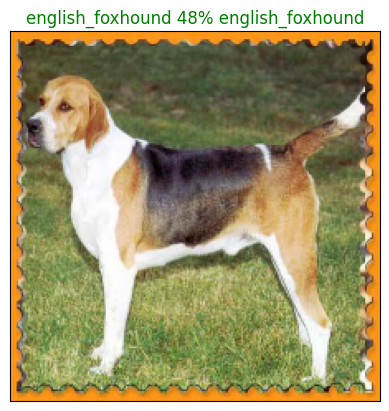

In [ ]:
plot_pred(prediction_probabilities= predictions,
          labels= val_labels,
          images= val_images,
          n=14)

from tensorflow.python.eager.backprop import indexed_slices
Now we've got one function to visualize our models top prediction, Let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an np.integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top prediction probabilities values and labels, coloring the true label green
  

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label= prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels, rotation="vertical")

  #Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color("green")






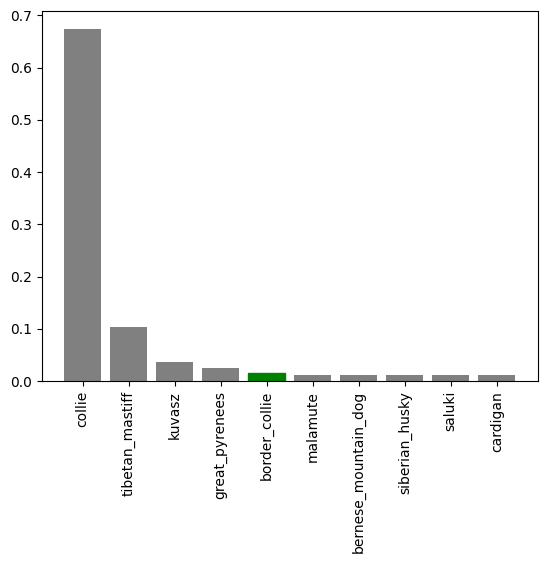

In [ ]:
plot_pred_conf(prediction_probabilities = predictions, labels=val_labels, n=9)

Now we've got some functions to help visualize our predictions and evaluate our modle, let's check out a few predictions and their different values

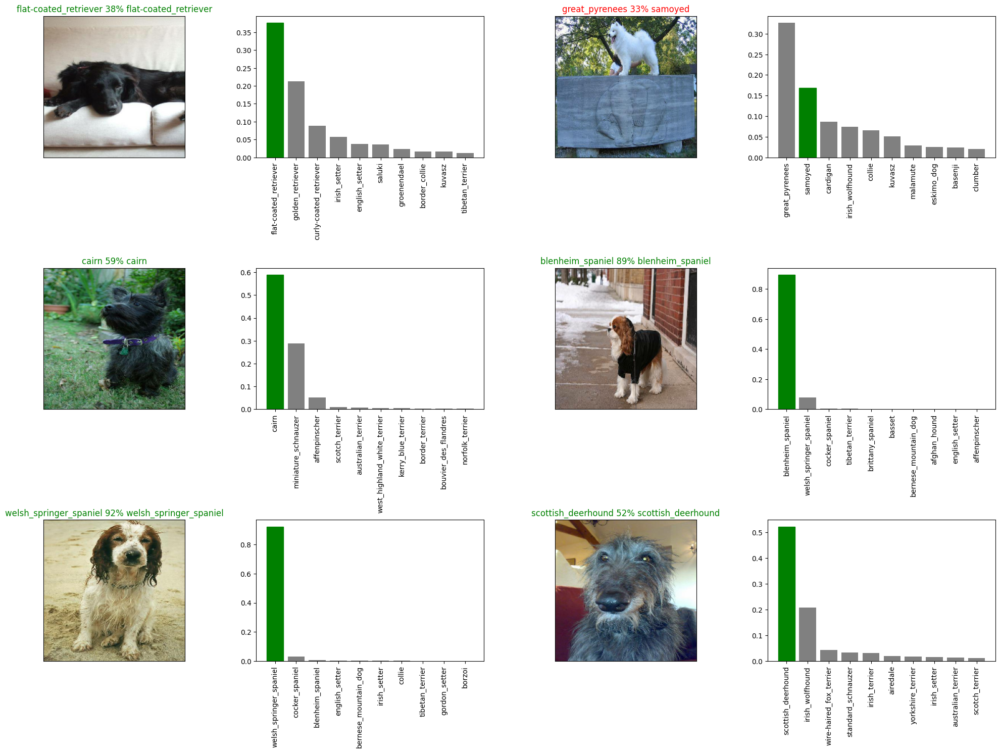

In [ ]:
i_multiplier = 20
num_rows= 3
num_cols= 2
num_images= num_rows* num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels= val_labels,
            images= val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels= val_labels,
                 n= i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Confusion  matrix with models prediction and true labels?

Saving and reloading a training model

In [ ]:
def save_model(model, suffix= None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current file
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path= modeldir +"-"+ suffix+".h5" #save format of model(like extension)
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading the saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have functions to save and load model, now test them!

In [ ]:
# Save the model trained on 1000 imaegs
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230520-08111684570283-1000-images-mobilenetv2-Adam.h5....


'/content/drive/MyDrive/Dog Vision/models/20230520-08111684570283-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading the saved trained modelA
loaded_1000_images_model= load_model("/content/drive/MyDrive/Dog Vision/models/20230520-06521684565551-1000-images-mobilenetv2-Adam.h5")

Loading the saved model from: /content/drive/MyDrive/Dog Vision/models/20230520-06521684565551-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 7s 847ms/step - loss: 5.8314 - accuracy: 0.0200


[5.831388473510742, 0.019999999552965164]

In [ ]:
#Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 6s 824ms/step - loss: 1.2861 - accuracy: 0.6350


[1.2860597372055054, 0.6349999904632568]

## Training the model (ON FULL DATA!)

> Indented block





In [ ]:
# Create a data batch with full data set
full_data= create_data_batches(X, y)


Create training data batches....


In [ ]:
len(X) , len(y)

(10222, 10222)

In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for a full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note**: Below cell may take a while for getting executed (approx 30 min. for first epochs) because the GPU under usage in the runtime has to load all of the data images into the memory.

In [ ]:
#Fit the full model to full data
full_model.fit(x= full_data,
               epochs= NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 107ms/step - loss: 1.3567 - accuracy: 0.6642
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.4079 - accuracy: 0.8788
Epoch 3/100
320/320 [==============================] - 34s 107ms/step - loss: 0.2397 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1557 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1042 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0762 - accuracy: 0.9882
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0602 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0464 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0380 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 34s 106m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230520-07301684567806-full-image-set-mobilenetv2-Adam.h5....


'/content/drive/MyDrive/Dog Vision/models/20230520-07301684567806-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model= load_model("/content/drive/MyDrive/Dog Vision/models/20230520-07301684567806-full-image-set-mobilenetv2-Adam.h5")

Loading the saved model from: /content/drive/MyDrive/Dog Vision/models/20230520-07301684567806-full-image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset

Since our model has been trained on image in the form of  Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filename as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to True (since the test data doesn't have labels).
* Make a prediction array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e4e991c432ce6d8e8ba26672ff8fb2f5.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e65d6492c026c925660d80543664b8a7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f27521a58ff23d0bb6390bd802b368c4.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ee45e29f0dfdc67fdb2939df8bf10b76.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ef5f1eb55d91360df896824ac4cc979b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f497ac35b94726e58d6298902794596f.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f16a73d54d86c0020bf1d63a29eb024b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f00b35c8f1a052d4989f17134532efb4.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

# Make predictions on test data batch using the loaded full model


In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)
#Already ran, just got accidentally deleted, may take few min. on GPU
#but around an hour to execute this cell

In [ ]:
# Save predictions(Numpy array) to csv file (for later on access)

np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
#Load predictions (Numpy array) from csv file
import numpy as np
test_predictions= np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions[:10]

array([[3.73791154e-05, 9.47649369e-07, 3.29240302e-09, ...,
        1.23599948e-08, 6.35792530e-10, 3.38765140e-08],
       [5.22058057e-11, 1.76444559e-07, 6.59440229e-06, ...,
        2.83400848e-04, 1.11320190e-07, 3.52448337e-09],
       [1.01094792e-11, 7.57549060e-05, 2.57099231e-10, ...,
        7.49423416e-05, 2.03292743e-07, 1.54679540e-07],
       ...,
       [4.03889935e-05, 3.28874314e-08, 5.08881044e-08, ...,
        1.44667780e-08, 3.26690497e-08, 1.98362803e-04],
       [4.82134388e-10, 1.14578974e-07, 2.90261841e-08, ...,
        6.23806631e-11, 6.02293468e-08, 8.24039859e-09],
       [1.61082400e-12, 1.96978059e-11, 5.61651984e-12, ...,
        1.04128817e-09, 2.90237923e-09, 1.07212649e-07]])

## Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our model probability outputs in a DataFrame  with an id column and an col for each different dog breed.

To get the data in this format , we'll:
* Create a panda DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create the pandas DataFrame
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]= test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4e991c432ce6d8e8ba26672ff8fb2f5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e65d6492c026c925660d80543664b8a7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e381c5fcf1420985b20117e4bc7d38cd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f27521a58ff23d0bb6390bd802b368c4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ee45e29f0dfdc67fdb2939df8bf10b76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4e991c432ce6d8e8ba26672ff8fb2f5,3.737912e-05,9.476494e-07,3.292403e-09,3.409331e-10,5.632699e-11,2.805118e-10,1.338816e-09,4.826229e-10,2.761264e-11,...,2.370215e-07,3.357982e-12,4.638034e-08,5.582822e-08,1.413285e-08,5.868833e-11,1.970152e-11,1.235999e-08,6.357925e-10,3.387651e-08
1,e65d6492c026c925660d80543664b8a7,5.220581e-11,1.764446e-07,6.594402e-06,1.629346e-06,5.790588e-07,5.364377e-06,5.164827e-08,3.034656e-10,7.292580e-05,...,2.554405e-09,1.438675e-07,4.013775e-07,3.524914e-05,1.123668e-06,6.261428e-03,4.445213e-07,2.834008e-04,1.113202e-07,3.524483e-09
2,e381c5fcf1420985b20117e4bc7d38cd,1.010948e-11,7.575491e-05,2.570992e-10,9.426604e-10,2.090219e-09,2.006360e-05,2.034156e-10,1.270696e-06,9.830229e-08,...,1.830932e-07,2.308794e-10,2.810894e-04,3.026928e-07,9.561538e-08,1.534593e-05,3.924520e-11,7.494234e-05,2.032927e-07,1.546795e-07
3,f27521a58ff23d0bb6390bd802b368c4,7.666902e-08,2.683020e-10,4.040456e-09,8.246348e-10,3.021302e-06,1.007251e-08,1.216140e-09,1.011974e-09,2.185603e-09,...,1.195942e-08,3.979600e-12,1.270393e-08,1.294505e-07,1.840886e-11,7.781370e-07,1.254912e-07,2.937913e-08,4.217755e-10,5.729482e-10
4,ee45e29f0dfdc67fdb2939df8bf10b76,5.770516e-12,5.360354e-10,2.044892e-08,5.762745e-10,8.015027e-07,3.480554e-13,3.969184e-12,3.577515e-10,8.883560e-11,...,6.891961e-10,2.520513e-09,5.639961e-12,2.658170e-12,2.238946e-12,1.543250e-13,6.051897e-14,7.603761e-05,3.372188e-13,5.506409e-13


In [ ]:
#Save our predictions dataframe to CSV for submissions to kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on the custom images

To make predictions on custom images :
* Get the filepath of custom images
* Turn the filepath into data batches using 'create_data_batches'. And Since our custom images won't
  have labels, we set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image filepaths
custom_path= "/content/drive/MyDrive/Dog Vision/Custom_images/"
custom_image_paths= [custom_path+ fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/Custom_images/German-Shepherd.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/Cheemanshu.jpg']

In [ ]:
#Turn custom images into batch datasets
custom_data= create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on custom data
custom_preds= loaded_full_model.predict(custom_data)


1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get the custom image prediction labels
custom_pred_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'miniature_pinscher']

In [ ]:
#Get custom images(our unbatchify() function won't work since there are'nt labels.. maybe we could fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

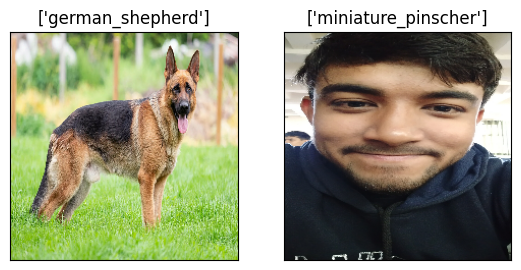

In [ ]:
#Check custom image  predictions
plt.figure(figsize= (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title([custom_pred_labels[i]])
  plt.imshow(image)


In [ ]:
custom_path= "/content/drive/MyDrive/Dog Vision/Custom_images/"
custom_image_paths= [custom_path+ fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/Custom_images/German-Shepherd.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/Cheemanshu.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/manass.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/manass - Copy.jpg']

In [ ]:
custom_image_paths.remove('/content/drive/MyDrive/Dog Vision/Custom_images/German-Shepherd.jpg')
custom_image_paths.remove( '/content/drive/MyDrive/Dog Vision/Custom_images/Cheemanshu.jpg')

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/Custom_images/manass.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/manass - Copy.jpg']

In [ ]:
custom_data= create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds= loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 83ms/step


In [ ]:
custom_pred_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pug', 'pug']

In [ ]:
#Get custom images(our unbatchify() function won't work since there are'nt labels.. maybe we could fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

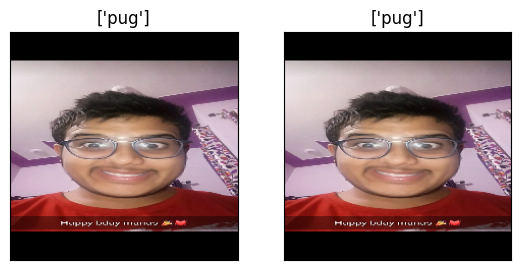

In [ ]:
#Check custom image  predictions
plt.figure(figsize= (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title([custom_pred_labels[i]])
  plt.imshow(image)


In [ ]:

custom_path= "/content/drive/MyDrive/Dog Vision/Custom_images/"
custom_image_paths= [custom_path+ fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths.remove("/content/drive/MyDrive/Dog Vision/Custom_images/.ipynb_checkpoints")
custom_image_paths

['/content/drive/MyDrive/Dog Vision/Custom_images/mastif.jpeg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/terry.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/om.jpg']

In [ ]:
custom_data= create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds= loaded_full_model.predict(custom_data)

1/1 [==============================] - 8s 8s/step


In [ ]:
custom_pred_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels


['tibetan_mastiff', 'lhasa', 'miniature_poodle']

In [ ]:
#Get custom images(our unbatchify() function won't work since there are'nt labels.. maybe we could fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

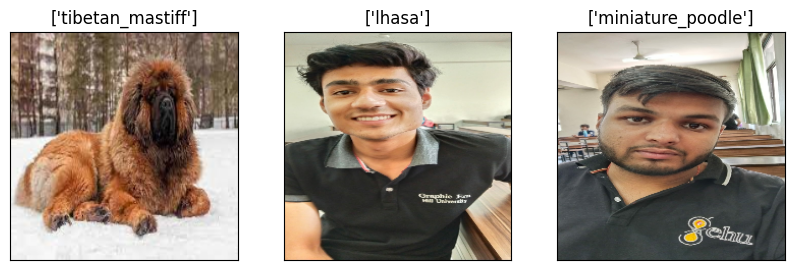

In [ ]:
#Check custom image  predictions
plt.figure(figsize= (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title([custom_pred_labels[i]])
  plt.imshow(image)
